In [1]:
import os
os.chdir('/work/OBBDetection')

import sys
import importlib
import glob
import pickle
import mlflow
import mmcv

import numpy as np

import matplotlib.pyplot as plt

import BboxToolkit as bt

from mmdet.apis import (init_detector,
                        inference_detector,
                        show_result_pyplot)

from IPython.display import (display,
                             Markdown)

def build_gt_like_result(gtdict,imgfn):
    
    gtdict_img_lst = [
        gtdict['content'][i]['ann']
        for i in range(len(gtdict['content']))
        if gtdict['content'][i]['id'].split('.')[0]==os.path.basename(imgfn).split('.')[0]
    ]
    
    gt = []
    
    print(
        'n_annots',
        gtdict_img_lst[0]['labels']
    )
    
    
    for gtdict_img in gtdict_img_lst:
        
        for label_id in range(15):

            bboxes_prob = np.zeros((0, 6))
            
            for enu,lab in enumerate(gtdict_img['labels']):
                
                if lab==label_id:
                    
                    bbox = np.asarray([el for el in bt.poly2obb( gtdict_img['bboxes'][enu] )]+[1.0]) # probab=1 since GT
                    bboxes_prob = np.concatenate((bboxes_prob,bbox.reshape((1,6))),axis=0)

            gt.append(bboxes_prob)
        
    return gt
        
def plot_20_samples(
    artifact_path,
    num_lst=[
        639,
        # 796,
        1927,
        # 549,
        1465,
        2517,
        1433,
        6,
        100,
        222,
        888,
        1522,
    ]):
    
    config_file = glob.glob(os.path.join(artifact_path,'*.py'))[0]
    checkpoint_file = os.path.join(artifact_path,'latest.pth')
    conf_module = os.path.basename(config_file).replace('.py','')
    
    sys.path.append(artifact_path)
    
    module = importlib.import_module(conf_module)
    
    gtfn = os.path.join(module.data['test']['ann_file'],'patch_annfile.pkl')
    with open(gtfn,'rb') as f:
        gtdict = pickle.load(f)
        
    model = init_detector(
        config_file,
        checkpoint_file,
        device='cpu'
    )

    for i in num_lst:
        
        imgfn = glob.glob(os.path.join(module.data['test']['img_prefix'],'*'))[i]
        display(Markdown(f'### NUMBER: {i} , IMG_ID: {os.path.basename(imgfn).split(".")[0]}'))
        # display(Markdown(f'### GROUND TRUTH'))
        # gt = build_gt_like_result(gtdict,imgfn)
        # show_result_pyplot(model, imgfn, gt,fig_size=(15, 15))
        # plt.show()
        display(Markdown(f'### INFERENCE'))
        result = inference_detector(model, imgfn)
        show_result_pyplot(model, imgfn, result,fig_size=(15, 15))
        plt.show()
    # unimport module
    sys.modules.pop(conf_module)
    # remove module path from syspath
    sys.path.remove(artifact_path)

__________________________________________

# quality: 90

Use load_from_local loader


### NUMBER: 639 , IMG_ID: P0864_0003

### INFERENCE

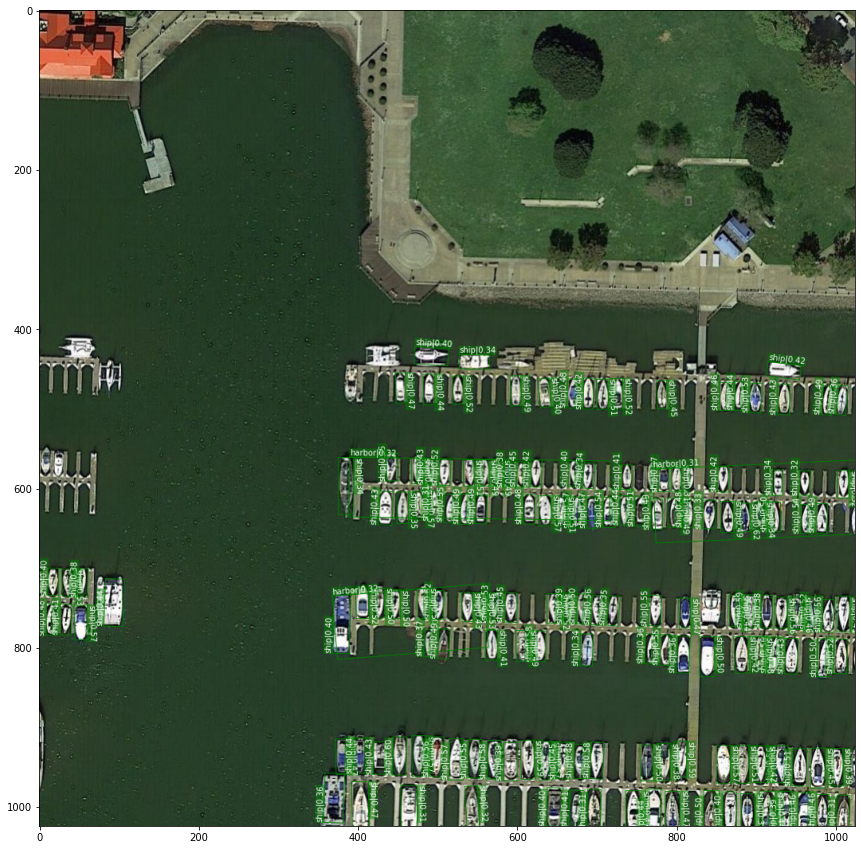

### NUMBER: 1927 , IMG_ID: P1924_0000

### INFERENCE

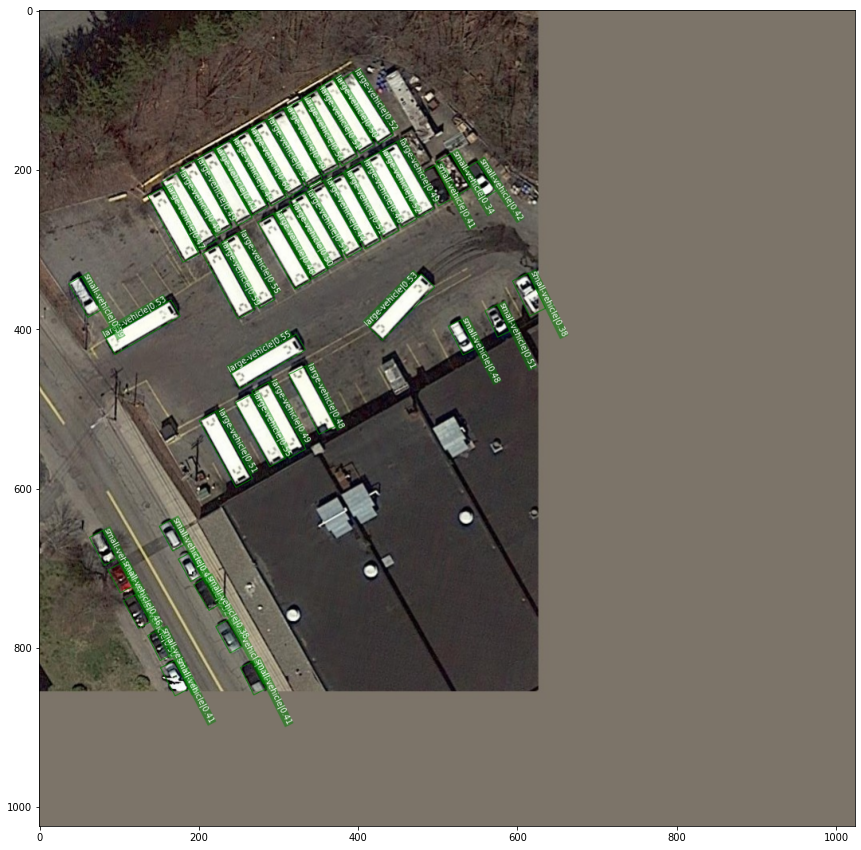

### NUMBER: 1465 , IMG_ID: P0189_0000

### INFERENCE

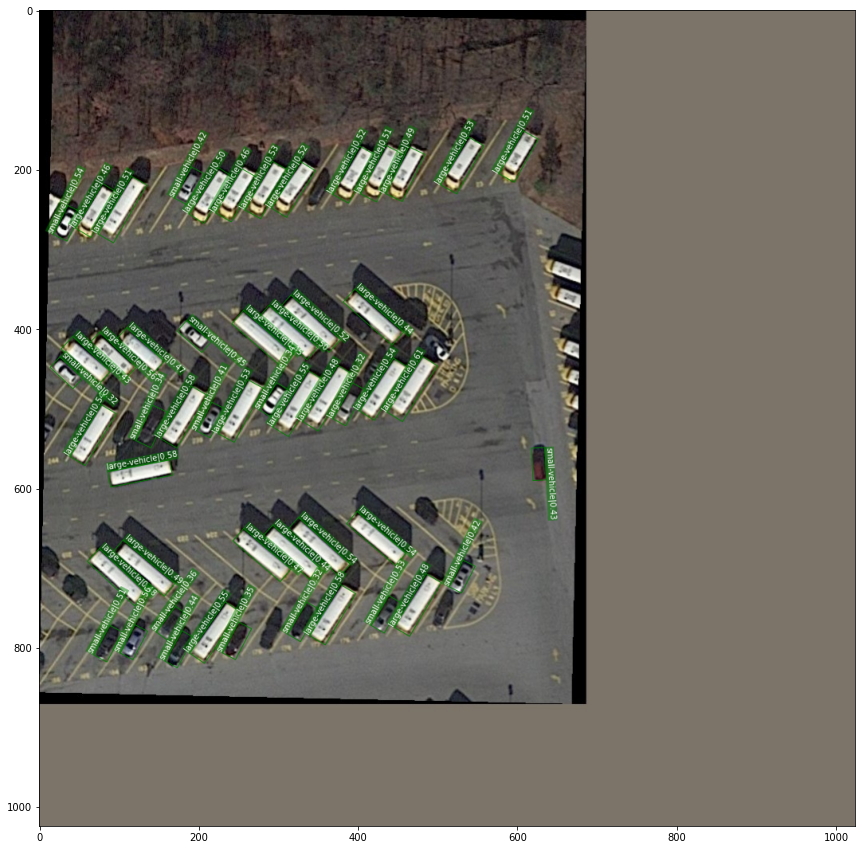

### NUMBER: 2517 , IMG_ID: P0199_0001

### INFERENCE

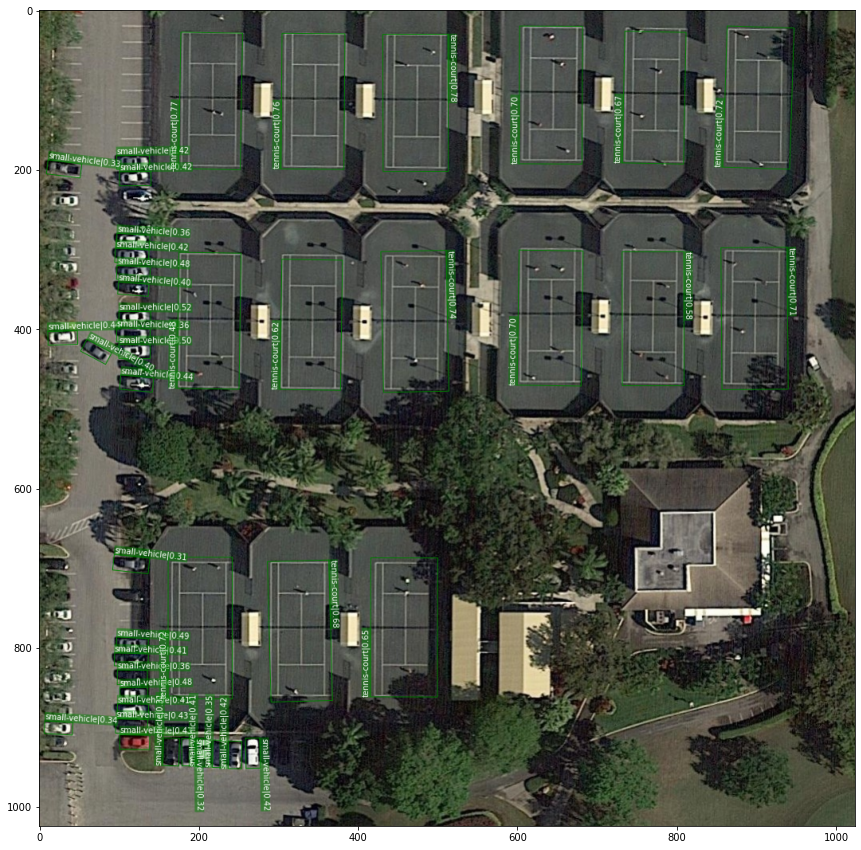

### NUMBER: 1433 , IMG_ID: P0715_0001

### INFERENCE

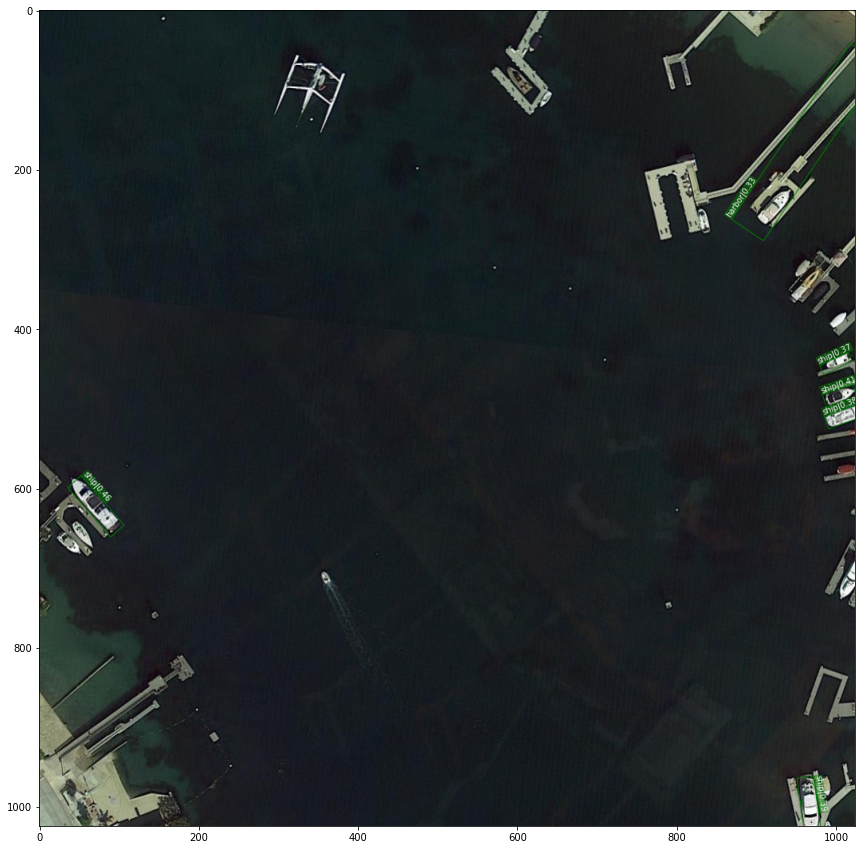

### NUMBER: 6 , IMG_ID: P2027_0004

### INFERENCE

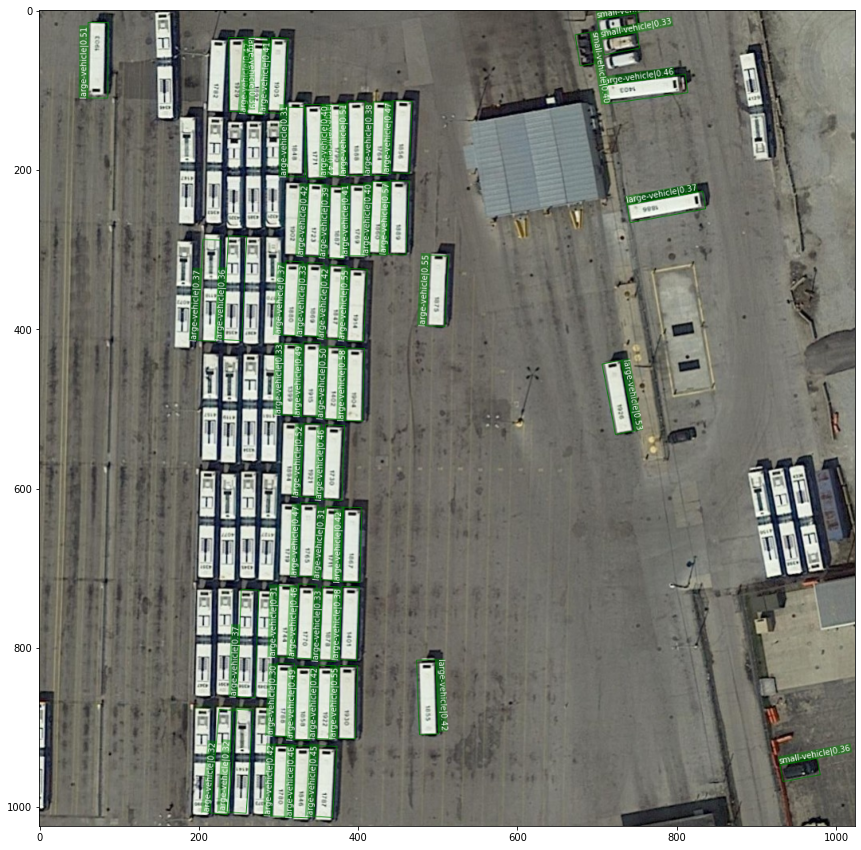

### NUMBER: 100 , IMG_ID: P0725_0000

### INFERENCE

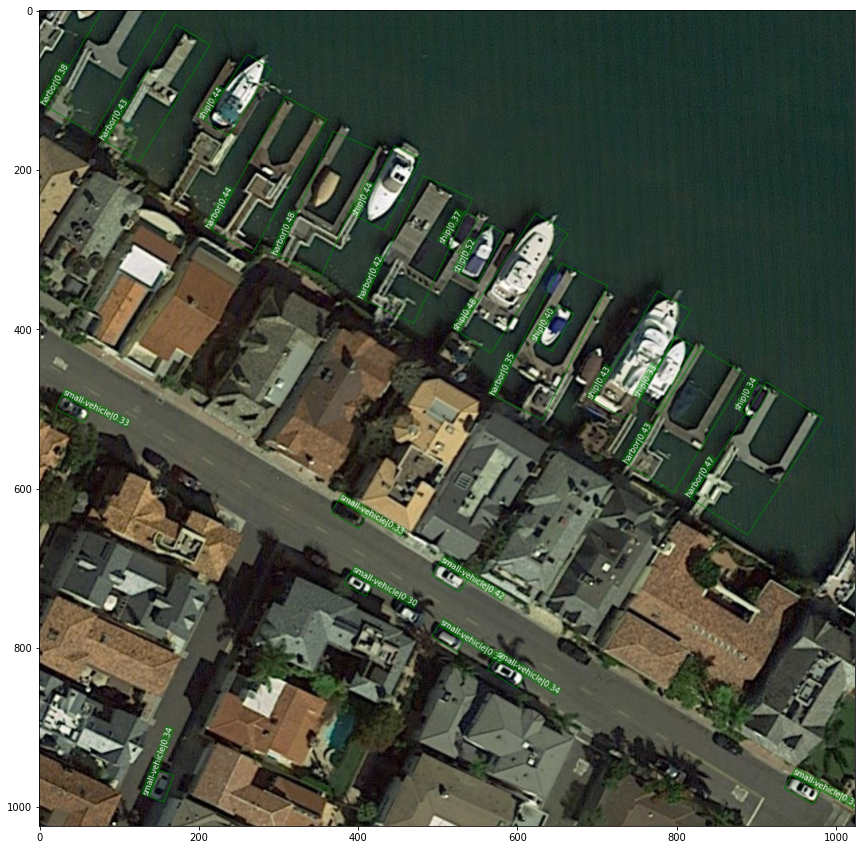

### NUMBER: 222 , IMG_ID: P1397_0010

### INFERENCE

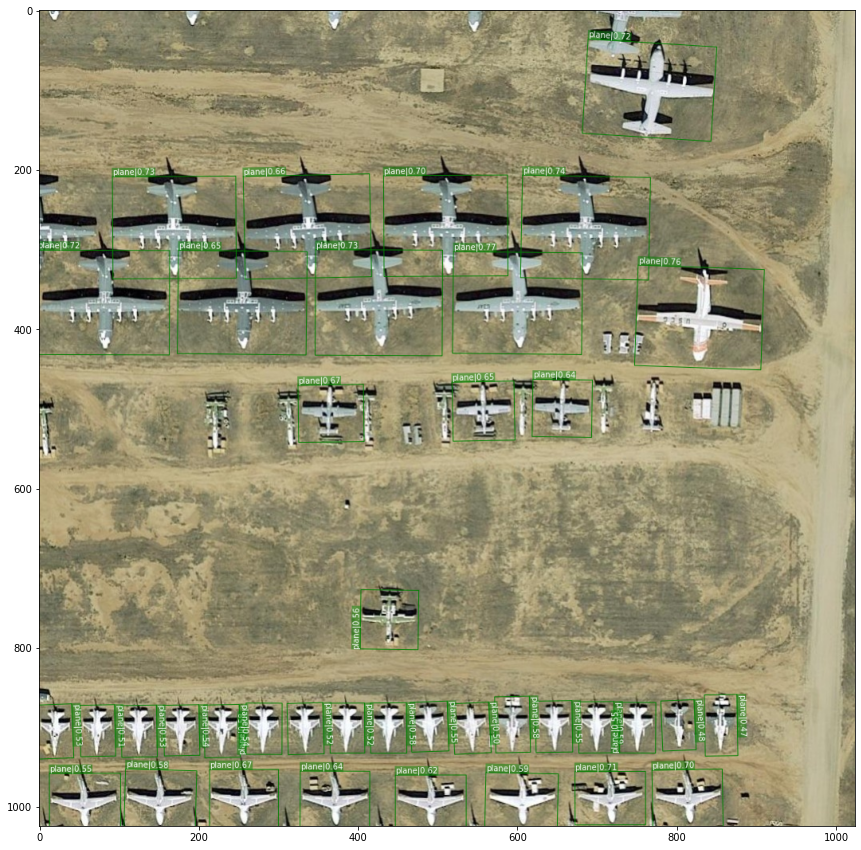

### NUMBER: 888 , IMG_ID: P0660_0001

### INFERENCE

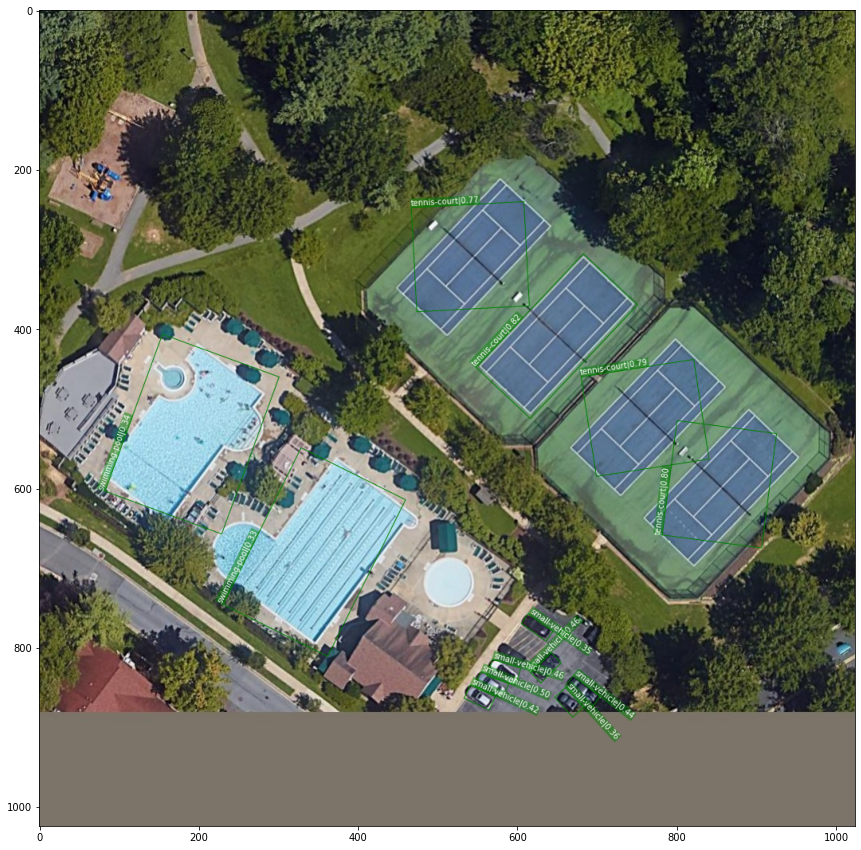

### NUMBER: 1522 , IMG_ID: P0375_0000

### INFERENCE

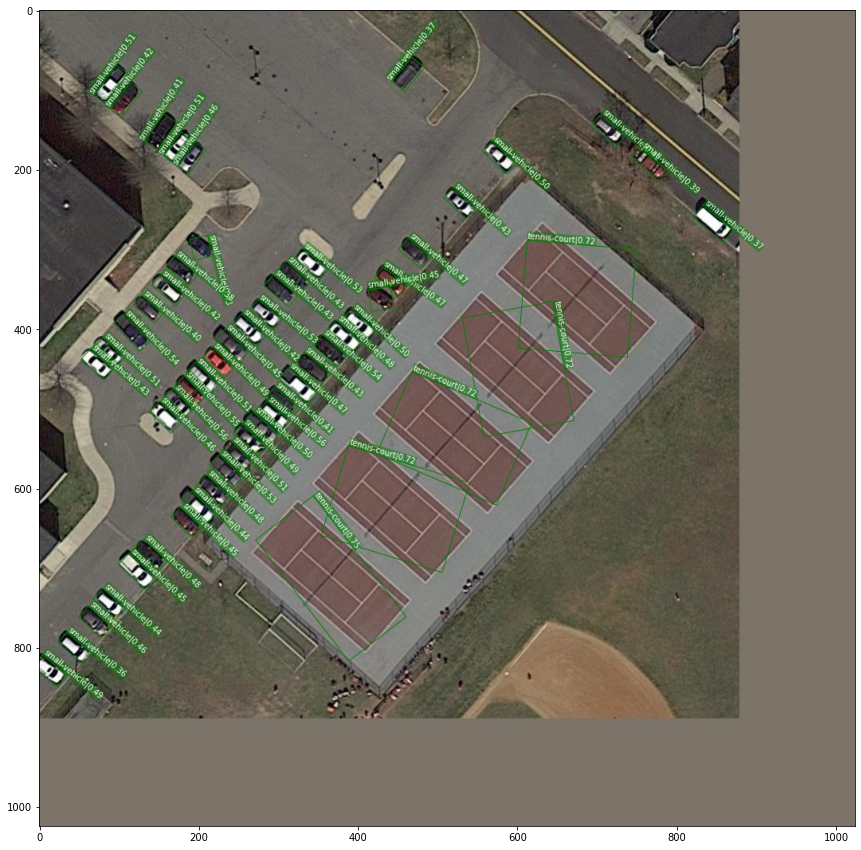

In [3]:
var = 'quality'
wanted_value = '90'
model_name='fcos'

experiment_id = '1'
tracking_uri = 'file:///work/mlruns'
mlflow.set_tracking_uri( tracking_uri )

for run in mlflow.search_runs([experiment_id],output_format='list'):
    
    if var not in run.data.params:
        continue
    
    value = run.data.params[var]
    
    if value!=wanted_value:
        continue
        
    if run.data.params['model']!=model_name:
        continue
        
    artifact_path = run.info.artifact_uri.replace('file://','')
    display(Markdown(f'__________________________________________'))
    display(Markdown(f'# {var}: {value}'))
    plot_20_samples(artifact_path)
    
    break